# 3W Dataset

## Tratamento inicial do conjunto e estudo dos dados - 01

Disciplina: SYSID<br>
Professor: Helon<br>
Grupo:
* Pedro Henrique
* Felipe Pereira

## Objetivo

Este notebook tem por objetivo fazer uma análise preliminar do 3W, tentando diagnosticar possíveis corrupções dos dados e outros tipos de problemas. Também se espera determinar o conjunto de dados mais robusto para uso na determinação dos problemas.

Esse nb depende da existência do arquivo `3w.pkl` na pasta <a href='./data'>data</a> deste projeto. Caso ele não exista, pode ser gerado executando-se o script <a href='./Tratamento00.py'>Tratamento00.py</a>.

## Passo 0 - Importando pacotes

In [45]:
import pandas as pd
import numpy as np
import os
from copy import deepcopy
import tabulate
import matplotlib.pyplot as plt
from general.support_functions import print_and_write
import pickle

In [3]:
binary = os.path.join(os.getcwd(), 'data', '3w.pkl')
print(binary)
raw_data = {}
with open(binary, 'rb') as bin_file:
    try:
        while True:
            content = pickle.load(bin_file)
            print('Read entry of events:', content[0])
            raw_data[content[0]] = content[1]
            del content
    except EOFError:
        pass

/mnt/d/OneDrive/Mestrado/Semestre 02/SYSID/SYSID_Trabalho/3W-dataset/data/3w.pkl
Read entry of events: 0
Read entry of events: 1
Read entry of events: 2
Read entry of events: 3
Read entry of events: 4
Read entry of events: 5
Read entry of events: 6
Read entry of events: 7
Read entry of events: 8


In [4]:
filt_var = [ 'P-PDG',
             'P-TPT',
             'T-TPT',
             'P-MON-CKP',
             'T-JUS-CKP',
             #'P-JUS-CKGL',
             #'T-JUS-CKGL',
             #'QGL',
             #'class',
             #'type',
            ]

for index in raw_data.keys():
    dicio = raw_data[index]
    todrop = []
    for typecase in dicio.keys():
        df = dicio[typecase]
        df = df[filt_var + ['class', 'type']]
        for var in filt_var:
            varvec = df[var].values
            if (np.std(varvec)/(np.sqrt(varvec @ varvec))) <= 1e-5:
                df.loc[:,var] = np.nan
        df = df.dropna()
        for var in filt_var:
            df = df[df[var]>0]
        if len(df) == 0:
            todrop.append(typecase)
        #else:
        dicio[typecase] = df
    for drop in todrop:
        del dicio[drop]

/tmp/ipykernel_17434/2960345615.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:,var] = np.nan
/tmp/ipykernel_17434/2960345615.py:21: RuntimeWarning: invalid value encountered in double_scalars
  if (np.std(varvec)/(np.sqrt(varvec @ varvec))) <= 1e-5:
/tmp/ipykernel_17434/2960345615.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:,var] = np.nan
/tmp/ipykernel_17434/2960345615.py:21: RuntimeWarning: invalid value encountered in double_scalars
  if (np.std(varvec)/(np.sqrt(varvec @ v

In [5]:
text_output = os.path.join(os.getcwd(), 'data', '3w-text-pt.txt')
print(text_output)
with open(text_output, 'w') as txt_file:
    for index in raw_data.keys():
        
        
        print_and_write(txt_file, '''
        ##################################################
        ##  Starting summary of case {}:                 ##
        ##################################################
        
        '''.format(index))
        print_and_write(txt_file, '''
        ## Total Cases
        ''')
        try:
            print_and_write(txt_file, tabulate.tabulate(pd.concat(list(raw_data[index].values())).describe(), headers='keys', tablefmt='psql'))
        except Exception:
            print_and_write(txt_file, '            No cases to print.')
            continue
        for typecase in raw_data[index].keys():
            print_and_write(txt_file, '''
        
        ## {} Case
        '''.format(typecase))
            print_and_write(txt_file, tabulate.tabulate(raw_data[index][typecase].describe(), headers='keys', tablefmt='psql'))
            
        print_and_write(txt_file, '')
        print_and_write(txt_file, '')
        print_and_write(txt_file, '')

/mnt/d/OneDrive/Mestrado/Semestre 02/SYSID/SYSID_Trabalho/3W-dataset/data/3w-text-pt.txt

        ##################################################
        ##  Starting summary of case 0:                 ##
        ##################################################
        
        

        ## Total Cases
        
            No cases to print.

        ##################################################
        ##  Starting summary of case 1:                 ##
        ##################################################
        
        

        ## Total Cases
        
+-------+---------------+--------------+---------------+------------------+--------------+--------------+
|       |         P-PDG |        P-TPT |         T-TPT |        P-MON-CKP |    T-JUS-CKP |        class |
|-------+---------------+--------------+---------------+------------------+--------------+--------------|
| count |   8.44181e+06 |  8.44181e+06 |   8.44181e+06 |      8.44181e+06 |  8.44181e+06 |  8.44181e+06 

In [6]:
binary = os.path.join(os.getcwd(), 'data', '3w-pt.pkl')
with open(binary, 'wb') as output:
    pickle.dump((filt_var, raw_data), output)

In [7]:
del raw_data
binary = os.path.join(os.getcwd(), 'data', '3w.pkl')
print(binary)
raw_data = {}
with open(binary, 'rb') as bin_file:
    try:
        while True:
            content = pickle.load(bin_file)
            print('Read entry of events:', content[0])
            raw_data[content[0]] = content[1]
            del content
    except EOFError:
        pass

/mnt/d/OneDrive/Mestrado/Semestre 02/SYSID/SYSID_Trabalho/3W-dataset/data/3w.pkl
Read entry of events: 0
Read entry of events: 1
Read entry of events: 2
Read entry of events: 3
Read entry of events: 4
Read entry of events: 5
Read entry of events: 6
Read entry of events: 7
Read entry of events: 8


In [8]:
filt_var = [ 'P-PDG',
             'P-TPT',
             #'T-TPT',
             'P-MON-CKP',
             #'T-JUS-CKP',
             #'P-JUS-CKGL',
             #'T-JUS-CKGL',
             #'QGL',
             #'class',
             #'type',
            ]

for index in raw_data.keys():
    dicio = raw_data[index]
    todrop = []
    for typecase in dicio.keys():
        df = dicio[typecase]
        df = df[filt_var + ['class', 'type']]
        for var in filt_var:
            varvec = df[var].values
            if (np.std(varvec)/(np.sqrt(varvec @ varvec))) <= 1e-5:
                df.loc[:,var] = np.nan
        df = df.dropna()
        for var in filt_var:
            df = df[df[var]>0]
        if len(df) == 0:
            todrop.append(typecase)
        #else:
        dicio[typecase] = df
    for drop in todrop:
        del dicio[drop]

/tmp/ipykernel_17434/1317174890.py:21: RuntimeWarning: invalid value encountered in double_scalars
  if (np.std(varvec)/(np.sqrt(varvec @ varvec))) <= 1e-5:
/tmp/ipykernel_17434/1317174890.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:,var] = np.nan
/tmp/ipykernel_17434/1317174890.py:21: RuntimeWarning: invalid value encountered in double_scalars
  if (np.std(varvec)/(np.sqrt(varvec @ varvec))) <= 1e-5:
/tmp/ipykernel_17434/1317174890.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.lo

In [9]:
text_output = os.path.join(os.getcwd(), 'data', '3w-text-p.txt')
print(text_output)
with open(text_output, 'w') as txt_file:
    for index in raw_data.keys():
        
        
        print_and_write(txt_file, '''
        ##################################################
        ##  Starting summary of case {}:                 ##
        ##################################################
        
        '''.format(index))
        print_and_write(txt_file, '''
        ## Total Cases
        ''')
        try:
            print_and_write(txt_file, tabulate.tabulate(pd.concat(list(raw_data[index].values())).describe(), headers='keys', tablefmt='psql'))
        except Exception:
            print_and_write(txt_file, '            No cases to print.')
            continue
        for typecase in raw_data[index].keys():
            print_and_write(txt_file, '''
        
        ## {} Case
        '''.format(typecase))
            print_and_write(txt_file, tabulate.tabulate(raw_data[index][typecase].describe(), headers='keys', tablefmt='psql'))
            
        print_and_write(txt_file, '')
        print_and_write(txt_file, '')
        print_and_write(txt_file, '')

/mnt/d/OneDrive/Mestrado/Semestre 02/SYSID/SYSID_Trabalho/3W-dataset/data/3w-text-p.txt

        ##################################################
        ##  Starting summary of case 0:                 ##
        ##################################################
        
        

        ## Total Cases
        
+-------+-----------------+-------------+-------------+-------------+
|       |           P-PDG |       P-TPT |   P-MON-CKP |       class |
|-------+-----------------+-------------+-------------+-------------|
| count |     1.98101e+06 | 1.98101e+06 | 1.98101e+06 | 1.98101e+06 |
| mean  |     4.13727e+07 | 1.96186e+07 | 9.88415e+06 | 0           |
| std   |     6.38149e+06 | 1.89479e+06 | 3.64068e+06 | 0           |
| min   | 74763.4         | 1.65803e+07 | 2.46376e+06 | 0           |
| 25%   |     4.36041e+07 | 1.80564e+07 | 9.28779e+06 | 0           |
| 50%   |     4.4858e+07  | 2.11466e+07 | 1.22258e+07 | 0           |
| 75%   |     4.4858e+07  | 2.11864e+07 | 1.22651e+07

In [10]:
binary = os.path.join(os.getcwd(), 'data', '3w-p.pkl')
with open(binary, 'wb') as output:
    pickle.dump((filt_var, raw_data), output)

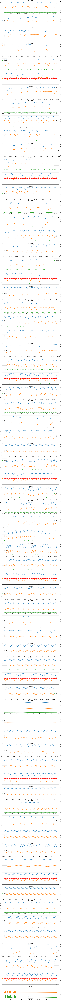

In [39]:
index = 3
case_keys = raw_data[index].keys()
n_wells = len(case_keys)
fig, axs = plt.subplots(n_wells,1, figsize=(20, 5*n_wells))
cases_data = raw_data[index]
for key, ax in zip(case_keys, axs):
    for var in filt_var:
        ax.plot(cases_data[key].index, cases_data[key][var], label=var)
    ax2 = ax.twinx()
    ax2.plot(cases_data[key].index, cases_data[key]['class'], 'r--')
    ax.legend()
    ax.set_title(key)

In [42]:
consolidate_wells = {}
for case in raw_data.values():
    for well in case.keys():
        if not 'WELL' in well: continue
        elif not well in consolidate_wells.keys(): consolidate_wells[well] = []
        consolidate_wells[well].append(case[well])

for well in consolidate_wells.keys():
    consolidate_wells[well] = pd.concat(consolidate_wells[well]).sort_index()



In [43]:
binary = os.path.join(os.getcwd(), 'data', '3w-p-wells.pkl')
with open(binary, 'wb') as output:
    pickle.dump((filt_var, raw_data), output)

/home/pedro-linux/miniconda3/envs/control/lib/python3.10/site-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


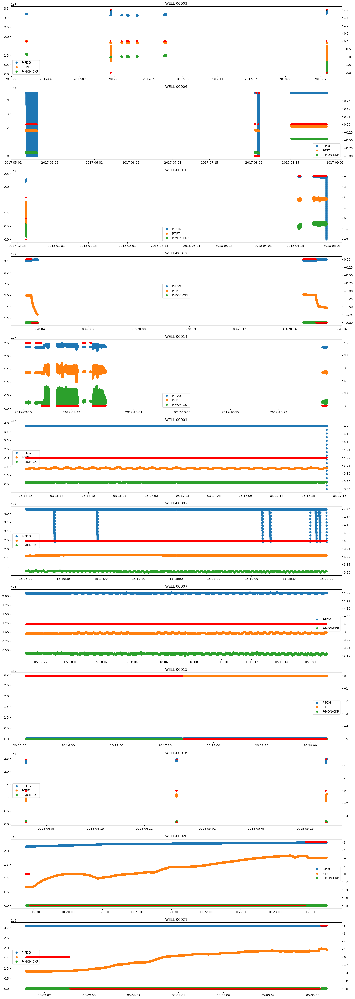

In [47]:

well_keys = consolidate_wells.keys()
n_wells = len(well_keys)
fig, axs = plt.subplots(n_wells,1, figsize=(20, 5*n_wells))
for key, ax in zip(well_keys, axs):
    for var in filt_var:
        ax.plot(consolidate_wells[key].index, consolidate_wells[key][var], 'o', label=var)
    ax2 = ax.twinx()
    ax2.plot(consolidate_wells[key].index, consolidate_wells[key]['class'], 'r*')
    ax.legend()
    ax.set_title(key)